 Reference: https://github.com/VidushiBhatia/U-Net-Implementation/blob/main/U_Net_for_Image_Segmentation_From_Scratch_Using_TensorFlow_v4.ipynb

In [1]:
import os
import random

import imageio
from PIL import Image

# for visualizations
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import numpy as np 

# for bulding and running deep learning model
import tensorflow as tf
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout 
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import concatenate
from tensorflow.keras.losses import binary_crossentropy
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator

tf.config.run_functions_eagerly(True)

In [2]:
filePath = '/home/shared/DARPA/patched_data/patch_size_256_patch_overlap_0_legend_size_256/training/'

### Visualize the input data 

In [3]:
def plotter(map_img, label_img, seg_img):
    plt.subplot(1,3,1)
    plt.title("map")
    plt.imshow(map_img)

    plt.subplot(1,3,2)
    plt.title("legend")
    plt.imshow(label_img) 
    
    plt.subplot(1,3,3)
    plt.title("segmentation")
    plt.imshow(seg_img)

def plotMap(fileName):
    mapName = 'map_patches/'+fileName
    segName = 'seg_patches/'+fileName
    labelName = 'labels/'+fileName

    map_img = mpimg.imread(filePath+mapName)
    seg_img = mpimg.imread(filePath+segName)
    label_img = mpimg.imread(filePath+labelName)
    
    plotter(map_img, label_img, seg_img)

    
 

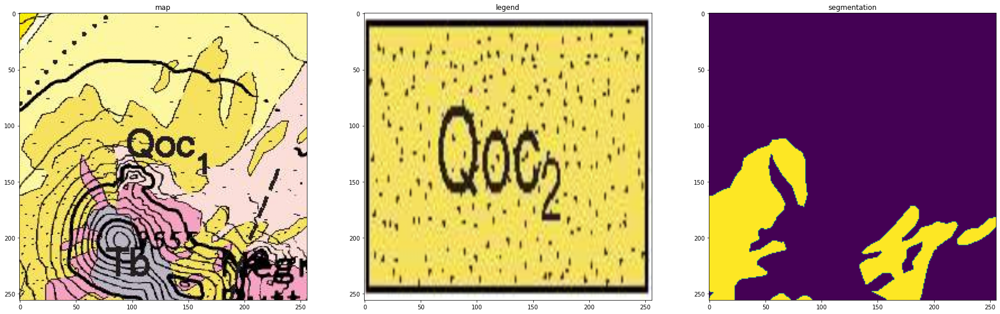

In [4]:
plt.figure(figsize=(30,10))   
plotMap('CA_CougarButtes_Qoc2_poly_426.png')

In [5]:
N = 256
cosMat = np.zeros((N,N))
for k in range(N):
    for n in range(N):
        cosMat[k,n] = np.cos((n + 0.5)*k*np.pi/N) 
cosMat = tf.convert_to_tensor(cosMat, dtype=tf.float32)
cosMat

2022-10-06 13:10:04.232698: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13870 MB memory:  -> device: 0, name: Tesla V100-SXM2-16GB, pci bus id: 0035:04:00.0, compute capability: 7.0


<tf.Tensor: shape=(256, 256), dtype=float32, numpy=
array([[ 1.        ,  1.        ,  1.        , ...,  1.        ,
         1.        ,  1.        ],
       [ 0.99998116,  0.9998306 ,  0.9995294 , ..., -0.9995294 ,
        -0.9998306 , -0.99998116],
       [ 0.9999247 ,  0.99932235,  0.9981181 , ...,  0.9981181 ,
         0.99932235,  0.9999247 ],
       ...,
       [ 0.01840673, -0.05519525,  0.09190895, ..., -0.09190895,
         0.05519525, -0.01840673],
       [ 0.01227154, -0.03680722,  0.06132074, ...,  0.06132074,
        -0.03680722,  0.01227154],
       [ 0.00613588, -0.01840673,  0.0306748 , ..., -0.0306748 ,
         0.01840673, -0.00613588]], dtype=float32)>

## create a datagenerator 

In [6]:
def load_img(filename):
    mapName = 'map_patches/'+filename
    legendName = 'labels/'+filename    
    
    map_img = tf.io.read_file(filePath+mapName) # Read image file
    map_img = tf.cast(tf.io.decode_png(map_img), dtype=tf.float32) / 255.0
    
    legend_img = tf.io.read_file(filePath+legendName) # Read image file
    legend_img = tf.cast(tf.io.decode_png(legend_img), dtype=tf.float32) / 255.0

    img = tf.concat(axis=2, values = [map_img, legend_img])
    img = img*2.0 - 1.0 # range(-1.0,1.0)
    resize_image = tf.image.resize(img, [256, 256])
    
    segName = 'seg_patches/'+filename
    seg = tf.io.read_file(filePath+segName) # Read image file
    seg = tf.io.decode_png(seg)/255
    resize_seg = tf.transpose(tf.image.resize(seg, [256, 256]), perm=[2,0,1])
    
    N = 256
    cosMat = np.zeros((N,N))
    for k in range(N):
        for n in range(N):
            cosMat[k,n] = np.cos((n + 0.5)*k*np.pi/N) 
    cosMat = tf.convert_to_tensor(cosMat, dtype=tf.float32)
    
    resize_seg_DCT = tf.linalg.matmul(cosMat, resize_seg)
    resize_seg_DCT = tf.linalg.matmul(resize_seg_DCT, tf.transpose(cosMat))
    
    resize_seg_reco = tf.linalg.matmul(tf.transpose(cosMat), resize_seg_DCT)
    resize_seg_reco = tf.linalg.matmul(resize_seg_reco, cosMat)*(2/N)
    
    
    resize_seg_DCT = tf.transpose(resize_seg_DCT, perm=[1,2,0])
    resize_seg_reco = tf.transpose(resize_seg_reco, perm=[1,2,0])
    resize_seg = tf.transpose(resize_seg, perm=[1,2,0])
    # Random up/down & left/right pixel shifts, 90 degree rotations
#     npix = 32
#     h = np.random.randint(-npix, npix + 1, 1)[0]  # Horizontal shift
#     v = np.random.randint(-npix, npix + 1, 1)[0]   # Vertical shift
#     r = np.random.randint(0, 4, 1)[0]              # 90 degree rotations
    
#     L, W = resize_image.shape
#     resize_image = np.pad(resize_image, ((npix, npix), (npix, npix)), 'constant')[npix + h:L + h + npix,
#                                    npix + v:W + v + npix]
#     resize_seg = np.pad(resize_seg, ((npix, npix), (npix, npix)), 'constant')[(pix + h):(L+ h + npix),
#                                    npix + v:W + v + npix]
#     resize_image, resize_seg = np.rot90(resize_image, r), np.rot90(resize_seg, r)
    
    return resize_image, resize_seg, resize_seg_DCT, resize_seg_reco

In [7]:
def load_imgDCT(filename):
    mapName = 'map_patches/'+filename
    legendName = 'labels/'+filename    
    
    map_img = tf.io.read_file(filePath+mapName) # Read image file
    map_img = tf.cast(tf.io.decode_png(map_img), dtype=tf.float32) / 255.0
    
    legend_img = tf.io.read_file(filePath+legendName) # Read image file
    legend_img = tf.cast(tf.io.decode_png(legend_img), dtype=tf.float32) / 255.0

    img = tf.concat(axis=2, values = [map_img, legend_img])
    img = img*2.0 - 1.0 # range(-1.0,1.0)
    resize_image = tf.image.resize(img, [256, 256])
    
    segName = 'seg_patches/'+filename
    seg = tf.io.read_file(filePath+segName) # Read image file
    seg = tf.io.decode_png(seg)/255
    resize_seg = tf.transpose(tf.image.resize(seg, [256, 256]), perm=[2,0,1])
    
    N = 256
    cosMat = np.zeros((N,N))
    for k in range(N):
        for n in range(N):
            cosMat[k,n] = np.cos((n + 0.5)*k*np.pi/N) 
    cosMat = tf.convert_to_tensor(cosMat, dtype=tf.float32)
    
    resize_seg_DCT = tf.linalg.matmul(cosMat, resize_seg)
    resize_seg_DCT = tf.linalg.matmul(resize_seg_DCT, tf.transpose(cosMat))
    
#     resize_seg_reco = tf.linalg.matmul(tf.transpose(cosMat), resize_seg_DCT)
#     resize_seg_reco = tf.linalg.matmul(resize_seg_reco, cosMat)*(2/N)
    
    
    resize_seg_DCT = tf.transpose(resize_seg_DCT, perm=[1,2,0])
#     resize_seg_reco = tf.transpose(resize_seg_reco, perm=[1,2,0])
#     resize_seg = tf.transpose(resize_seg, perm=[1,2,0])
    # Random up/down & left/right pixel shifts, 90 degree rotations
#     npix = 32
#     h = np.random.randint(-npix, npix + 1, 1)[0]  # Horizontal shift
#     v = np.random.randint(-npix, npix + 1, 1)[0]   # Vertical shift
#     r = np.random.randint(0, 4, 1)[0]              # 90 degree rotations
    
#     L, W = resize_image.shape
#     resize_image = np.pad(resize_image, ((npix, npix), (npix, npix)), 'constant')[npix + h:L + h + npix,
#                                    npix + v:W + v + npix]
#     resize_seg = np.pad(resize_seg, ((npix, npix), (npix, npix)), 'constant')[(pix + h):(L+ h + npix),
#                                    npix + v:W + v + npix]
#     resize_image, resize_seg = np.rot90(resize_image, r), np.rot90(resize_seg, r)
    
    return resize_image, resize_seg_DCT

In [8]:
img, seg, segDCT, segreco = load_img('CA_CougarButtes_Qoc2_poly_426.png')

In [9]:
seg.shape

TensorShape([256, 256, 1])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


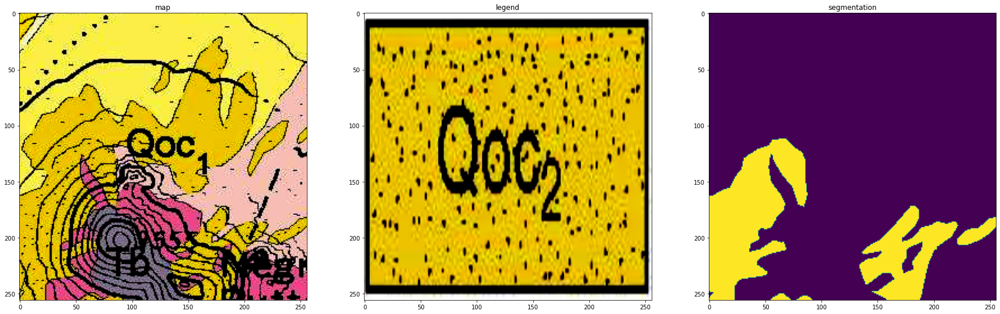

In [10]:
plt.figure(figsize=(30,10))
plotter(img[:,:,:3], img[:,:,3:], seg)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


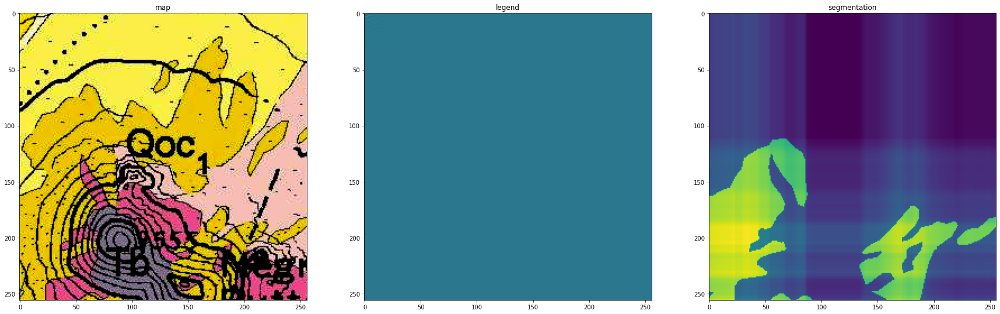

In [11]:
plt.figure(figsize=(30,10))
plotter(img[:,:,:3], segDCT, segreco)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


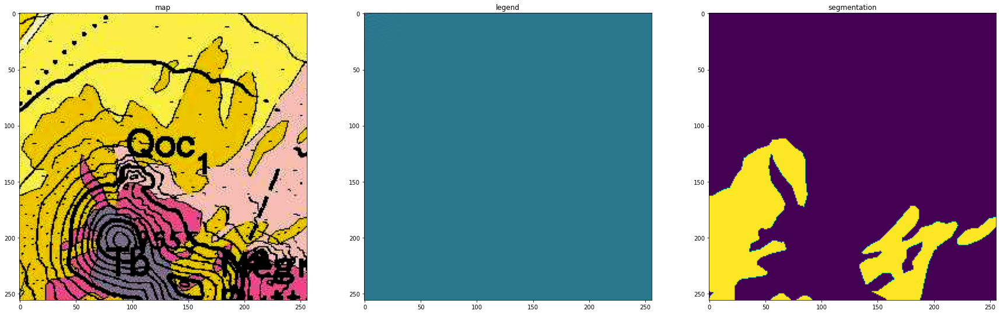

In [12]:
segreco2 = segreco.numpy().flatten()
thr = (segreco2.max() + segreco2.min())/2.0
segreco = segreco.numpy()
segreco[segreco < thr] = 0.
segreco[segreco >= thr] = 1.
segreco = tf.convert_to_tensor(segreco, dtype=tf.float32)
plt.figure(figsize=(30,10))
plotter(img[:,:,:3], segDCT, segreco)

In [12]:
filenames = [f for f in os.listdir(filePath+'map_patches') if '_poly_' in f]

In [13]:
len(filenames)

235693

In [14]:
all_files = os.listdir(filePath+'map_patches')
len(all_files)

276549

In [15]:
train_file, validate_file = train_test_split(filenames, train_size=0.8, random_state=42)
len(train_file), len(validate_file), len(filenames)

train_dataset = tf.data.Dataset.from_tensor_slices(train_file)
train_dataset = train_dataset.map(load_imgDCT)
train_dataset = train_dataset.shuffle(500).batch(80)

# A peek of how BatchDataset 
# it = iter(train_dataset)
# print(next(it))

validate_dataset = tf.data.Dataset.from_tensor_slices(validate_file)
validate_dataset = validate_dataset.map(load_imgDCT)
validate_dataset = validate_dataset.shuffle(100).batch(10)

/opt/miniconda3/envs/opence-v1.6.1/lib/python3.9/site-packages/tensorflow/python/data/ops/structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


## Constructing the U-Net Architecture

### U-Net Encoder Block

In [16]:
def EncoderMiniBlock(inputs, n_filters=32, dropout_prob=0.3, max_pooling=True):
    """
    This block uses multiple convolution layers, max pool, relu activation to create an architecture for learning. 
    Dropout can be added for regularization to prevent overfitting. 
    The block returns the activation values for next layer along with a skip connection which will be used in the decoder
    """
    conv = Conv2D(n_filters, 
                  3,   # Kernel size   
                  activation='relu',
                  padding='same',
                  kernel_initializer='HeNormal')(inputs)
    conv = Conv2D(n_filters, 
                  3,   # Kernel size
                  activation='relu',
                  padding='same',
                  kernel_initializer='HeNormal')(conv)
    
    # Batch Normalization will normalize the output of the last layer based on the batch's mean and standard deviation
    conv = BatchNormalization()(conv, training=False)

    # In case of overfitting, dropout will regularize the loss and gradient computation to shrink the influence of weights on output
    if dropout_prob > 0:     
        conv = tf.keras.layers.Dropout(dropout_prob)(conv)

    if max_pooling:
        next_layer = tf.keras.layers.MaxPooling2D(pool_size = (2,2))(conv)    
    else:
        next_layer = conv

    # skip connection (without max pooling) will be input to the decoder layer to prevent information loss during transpose convolutions      
    skip_connection = conv
    
    return next_layer, skip_connection

### U-Net Decoder Block

In [17]:
def DecoderMiniBlock(prev_layer_input, skip_layer_input, n_filters=32):
    """
    Decoder Block first uses transpose convolution to upscale the image to a bigger size and then,
    merges the result with skip layer results from encoder block
    Adding 2 convolutions with 'same' padding helps further increase the depth of the network for better predictions
    The function returns the decoded layer output
    """
    # Start with a transpose convolution layer to first increase the size of the image
    up = Conv2DTranspose(
                 n_filters,
                 (3,3),    # Kernel size
                 strides=(2,2),
                 padding='same')(prev_layer_input)

    # Merge the skip connection from previous block to prevent information loss
    merge = concatenate([up, skip_layer_input], axis=3)
    
    # Add 2 Conv Layers with relu activation and HeNormal initialization for further processing
    # The parameters for the function are similar to encoder
    conv = Conv2D(n_filters, 
                 3,     # Kernel size
                 activation='relu',
                 padding='same',
                 kernel_initializer='HeNormal')(merge)
    conv = Conv2D(n_filters,
                 3,   # Kernel size
                 activation='relu',
                 padding='same',
                 kernel_initializer='HeNormal')(conv)
    return conv

### Compile U-Net Blocks

In [18]:
def UNetCompiled(input_size=(256, 256, 6), cosMat=tf.eye(256), n_filters=32, n_classes=1):
    """
       Combine both encoder and decoder blocks according to the U-Net research paper
       Return the model as output 
    """
    # Input size represent the size of 1 image (the size used for pre-processing) 
    inputs = Input(input_size)
    
    # Encoder includes multiple convolutional mini blocks with different maxpooling, dropout and filter parameters
    # Observe that the filters are increasing as we go deeper into the network which will increasse the # channels of the image 
    cblock1 = EncoderMiniBlock(inputs, n_filters,dropout_prob=0, max_pooling=True)
    cblock2 = EncoderMiniBlock(cblock1[0],n_filters*2,dropout_prob=0, max_pooling=True)
    cblock3 = EncoderMiniBlock(cblock2[0], n_filters*4,dropout_prob=0, max_pooling=True)
    cblock4 = EncoderMiniBlock(cblock3[0], n_filters*8,dropout_prob=0.3, max_pooling=True)
    cblock5 = EncoderMiniBlock(cblock4[0], n_filters*16, dropout_prob=0.3, max_pooling=False) 
    
    # Decoder includes multiple mini blocks with decreasing number of filters
    # Observe the skip connections from the encoder are given as input to the decoder
    # Recall the 2nd output of encoder block was skip connection, hence cblockn[1] is used
    ublock6 = DecoderMiniBlock(cblock5[0], cblock4[1],  n_filters * 8)
    ublock7 = DecoderMiniBlock(ublock6, cblock3[1],  n_filters * 4)
    ublock8 = DecoderMiniBlock(ublock7, cblock2[1],  n_filters * 2)
    ublock9 = DecoderMiniBlock(ublock8, cblock1[1],  n_filters)

    # Complete the model with 1 3x3 convolution layer (Same as the prev Conv Layers)
    # Followed by a 1x1 Conv layer to get the image to the desired size. 
    # Observe the number of channels will be equal to number of output classes
    conv9 = Conv2D(n_filters,
                 3,
                 activation='relu',
                 padding='same',
                 kernel_initializer='he_normal')(ublock9)

    conv10 = Conv2D(n_classes, 1, padding='same', activation="sigmoid")(conv9)
    
    ## Perform cosine transform
#     N = 256
#     cosMat = np.zeros((N,N))
#     for k in range(N):
#         for n in range(N):
#             cosMat[k,n] = np.cos((n + 0.5)*k*np.pi/N) 
#     cosMat = tf.convert_to_tensor(cosMat, dtype=tf.float32)
    
    
    seg_DCT = tf.linalg.matmul(cosMat, tf.transpose(conv10, perm=[0,3,1,2]))
    seg_DCT = tf.linalg.matmul(seg_DCT, tf.transpose(cosMat))
    seg_DCT = tf.transpose(seg_DCT, perm=[0,2,3,1])
    
    # Define the model
    model = tf.keras.Model(inputs=inputs, outputs=seg_DCT)

    return model

In [29]:
# from keras import backend as K

def myacc(y_true, y_pred):
#     print(type(y_true), y_true.shape)
    y_true = tf.transpose(y_true, perm=[0,3,1,2])
    y_pred = tf.transpose(y_pred, perm=[0,3,1,2])
    N = 256
#     print(type(y_true), y_true.shape)
    ## Inverse DCT of y_true
    true_reco = tf.linalg.matmul(tf.transpose(cosMat), y_true)
    true_reco = tf.linalg.matmul(true_reco, cosMat)*(2/N)
    true_reco = true_reco.numpy()
    thr = ((true_reco.max(axis=(1,2,3)) + true_reco.min(axis=(1,2,3)))/2.0).reshape(-1,1,1,1)
    true_reco[true_reco < thr] = 0.
    true_reco[true_reco >= thr] = 1.
#     true_reco = tf.convert_to_tensor(true_reco)
    
    ## Inverse DCT of y_pred
    pred_reco = tf.linalg.matmul(tf.transpose(cosMat), y_pred)
    pred_reco = tf.linalg.matmul(pred_reco, cosMat)*(2/N)
    pred_reco = pred_reco.numpy()
    thr = ((pred_reco.max(axis=(1,2,3)) + pred_reco.min(axis=(1,2,3)))/2.0).reshape(-1,1,1,1)
    pred_reco[pred_reco < thr] = 0.
    pred_reco[pred_reco >= thr] = 1.
#     pred_reco = tf.convert_to_tensor(pred_reco)
    
    return ((true_reco == pred_reco).astype(float).sum((1,2,3))/N**2).mean()

In [35]:
# Call the helper function for defining the layers for the model, given the input image size
unet = UNetCompiled(input_size=(256,256,6), cosMat=cosMat, n_filters=16, n_classes=1)

### Compile and Run Model

In [36]:
# unet.compile(optimizer=tf.keras.optimizers.Adam(), 
#              loss=tf.keras.losses.binary_crossentropy, #SparseCategoricalCrossentropy(from_logits=True),
#               metrics=['accuracy', 'acc'])
unet.compile(optimizer=tf.keras.optimizers.Adam(), 
             loss=tf.keras.losses.MeanSquaredError(), #SparseCategoricalCrossentropy(from_logits=True),
              metrics=['mse', myacc])

In [37]:
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='my_saved_model/best_model_polyUNETDCT.hdf5', 
    monitor='loss',
    verbose=1, 
    save_best_only=True,
    save_freq= 500)

In [38]:
# load weights
unet.load_weights("./my_saved_model/best_model_polyUNETDCT.hdf5")

# Run the model in a mini-batch fashion and compute the progress for each epoch
results = unet.fit(train_dataset, epochs=1, callbacks=[cp_callback], validation_data=validate_dataset)

 499/2357 [=====>........................] - ETA: 30:20 - loss: 1227.4729 - mse: 1227.4729 - myacc: 0.9511
Epoch 1: loss improved from inf to 1227.94556, saving model to my_saved_model/best_model_polyUNETDCT.hdf5
 999/2357 [===========>..................] - ETA: 22:14 - loss: 1198.6954 - mse: 1198.6954 - myacc: 0.9518
Epoch 1: loss improved from 1227.94556 to 1198.36975, saving model to my_saved_model/best_model_polyUNETDCT.hdf5
1499/2357 [==================>...........] - ETA: 14:03 - loss: 1161.5450 - mse: 1161.5450 - myacc: 0.9531
Epoch 1: loss improved from 1198.36975 to 1161.53870, saving model to my_saved_model/best_model_polyUNETDCT.hdf5
1999/2357 [========================>.....] - ETA: 5:53 - loss: 1142.8147 - mse: 1142.8147 - myacc: 0.9538
Epoch 1: loss improved from 1161.53870 to 1143.00684, saving model to my_saved_model/best_model_polyUNETDCT.hdf5
2357/2357 [==============================] - 2903s 1s/step - loss: 1141.4944 - mse: 1141.4944 - myacc: 0.9538 - val_loss: 978.43

In [39]:
# serialize and save the model that you just trained 
saved_model_path = "./my_saved_model/my_model_polyUNETDCT.h5" 
unet.save(saved_model_path)

In [40]:
results.history

{'loss': [1141.494384765625],
 'mse': [1141.494384765625],
 'myacc': [0.9538381695747375],
 'val_loss': [978.4325561523438],
 'val_mse': [978.4325561523438],
 'val_myacc': [0.9589162468910217]}

## Evaluate Model Results

### Bias Variance Check

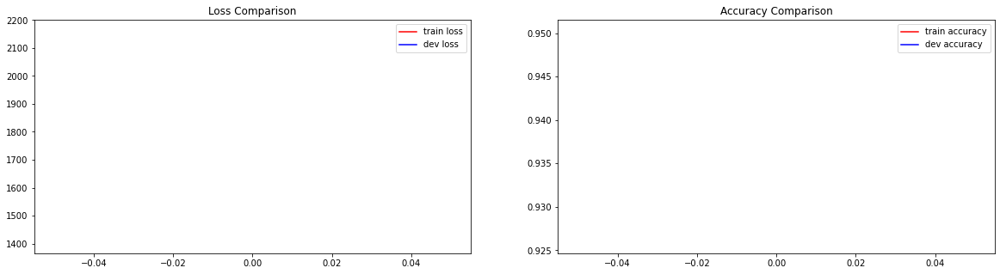

In [94]:
fig, axis = plt.subplots(1, 2, figsize=(20, 5))
axis[0].plot(results.history["loss"], color='r', label = 'train loss')
axis[0].plot(results.history["val_loss"], color='b', label = 'dev loss')
axis[0].set_title('Loss Comparison')
axis[0].legend()
axis[1].plot(results.history["myacc"], color='r', label = 'train accuracy')
axis[1].plot(results.history["val_myacc"], color='b', label = 'dev accuracy')
axis[1].set_title('Accuracy Comparison')
axis[1].legend()
plt.show()

### View Predicted Segmentations

In [41]:
unet.load_weights("./my_saved_model/best_model_polyUNETDCT.hdf5")

In [42]:
def f_score_calculator(mat_true, mat_pred):
    overlap=mat_true*mat_pred
    num_overlap=len(np.argwhere(overlap==1))
#     print('num_overlap:', num_overlap)
    num_mat_pred=len(np.argwhere(mat_pred==1))
#     print('num_mat_pred:', num_mat_pred)
    num_mat_true=len(np.argwhere(mat_true==1))
#     print('num_mat_true:', num_mat_true)
    precision=num_overlap/(num_mat_pred+1) #avoid divide by zero! NOT AVAILABLE IN ACTUAL metric
    recall=num_overlap/(num_mat_true+1) #avoid divide by zero! NOT AVAILABLE IN ACTUAL metric


    # calculate f-score
    if precision+recall!=0:
        f_score=(2 * precision * recall) / (precision + recall)
    else:
        f_score=0
        
    return precision, recall, f_score

In [50]:
def newplotter(fileName, map_img, label_img, seg_img, predicted, n=5):
    plt.rcParams["figure.figsize"] = (25,10)
    
    if fileName.split('.')[0].split('_')[-2]=='poly':
        plt.subplot(n,5,1)
        plt.title("map")
        plt.imshow(map_img)

        plt.subplot(n,5,2)
        plt.title("legend")
        plt.imshow(label_img)

        plt.subplot(n,5,3)
        plt.title("true segmentation")
        plt.imshow(seg_img, cmap='gray') 

        plt.subplot(n,5,4)
        plt.title("predicted segmentation")
        plt.imshow(predicted[0,:,:,:], cmap='gray') 

        plt.subplot(n,5,5)
        plt.title("error")
        plt.imshow(predicted[0,:,:,0]-seg_img) 
        plt.show()
        
    elif fileName.split('.')[0].split('_')[-2]=='pt':
        plt.subplot(n,5,1)
        plt.title("map")
        plt.imshow(map_img)

        plt.subplot(n,5,2)
        plt.title("legend")
        plt.imshow(label_img)

        plt.subplot(n,5,3)
        plt.title("true segmentation")
        plt.spy(seg_img, markersize=5) 

        plt.subplot(n,5,4)
        plt.title("predicted segmentation")
        predicted[predicted >= 0.5] = 1
        predicted[predicted < 0.5] = 0
        plt.spy(predicted[0,:,:,0], markersize=5) 

        plt.subplot(n,5,5)
        plt.title("error")
        plt.spy(predicted[0,:,:,0]-seg_img, markersize=5) 
        plt.show()
        
    #return [precision, recall, f_score]
    


def plotResult(n, fileName):
    test_dataset = tf.data.Dataset.from_tensor_slices([fileName])
    test_dataset = test_dataset.map(load_imgDCT)
    test_dataset = test_dataset.batch(1)

    predicted = unet.predict(test_dataset)
    #return predicted
    
    y_pred = tf.transpose(predicted, perm=[0,3,1,2])
    N = 256
#     print(type(y_true), y_true.shape)
    ## Inverse DCT of y_true
    pred_reco = tf.linalg.matmul(tf.transpose(cosMat), y_pred)
    pred_reco = tf.linalg.matmul(pred_reco, cosMat)*(2/N)
    pred_reco = pred_reco.numpy()
    thr = (pred_reco.max() + pred_reco.min())/2.0
    pred_reco[pred_reco < thr] = 0.
    pred_reco[pred_reco >= thr] = 1.
    predicted = tf.convert_to_tensor(pred_reco, dtype=tf.float32)
    predicted = tf.transpose(predicted, perm=[0,2,3,1])
    
    
#     predicted[predicted >= 0.5] = 1
#     predicted[predicted < 0.5] = 0
    mapName = 'map_patches/'+fileName
    segName = 'seg_patches/'+fileName

    map_img = mpimg.imread(filePath+mapName)
    seg_img = mpimg.imread(filePath+segName)
    
    # precision, recall, f_score = f_score_calculator(predicted[0,:,:,:], map_img)
    
    labelName = 'labels/'+fileName
    label_img = mpimg.imread(filePath+labelName)
    
    newplotter(fileName, map_img, label_img, seg_img, predicted, n=n)
    
   

In [46]:
def getMetric(fileName):
    test_dataset = tf.data.Dataset.from_tensor_slices([fileName])
    test_dataset = test_dataset.map(load_imgDCT)
    test_dataset = test_dataset.batch(1)

    predicted = unet.predict(test_dataset)
    
    y_pred = tf.transpose(predicted, perm=[0,3,1,2])
    N = 256
#     print(type(y_true), y_true.shape)
    ## Inverse DCT of y_true
    pred_reco = tf.linalg.matmul(tf.transpose(cosMat), y_pred)
    pred_reco = tf.linalg.matmul(pred_reco, cosMat)*(2/N)
    pred_reco = pred_reco.numpy()
    thr = (pred_reco.max() + pred_reco.min())/2.0
    pred_reco[pred_reco < thr] = 0.
    pred_reco[pred_reco >= thr] = 1.
    predicted = tf.convert_to_tensor(pred_reco, dtype=tf.float32)
    predicted = tf.transpose(predicted, perm=[0,2,3,1])
    
    
#     predicted[predicted >= 0.5] = 1
#     predicted[predicted < 0.5] = 0
    mapName = 'map_patches/'+fileName
    segName = 'seg_patches/'+fileName

    map_img = mpimg.imread(filePath+mapName)
    seg_img = mpimg.imread(filePath+segName)
    
    labelName = 'labels/'+fileName
    label_img = mpimg.imread(filePath+labelName)
    
    precision, recall, f_score = f_score_calculator(seg_img, predicted[0,:,:,0])
    
    return [precision, recall, f_score], [fileName, map_img, label_img, seg_img, predicted]

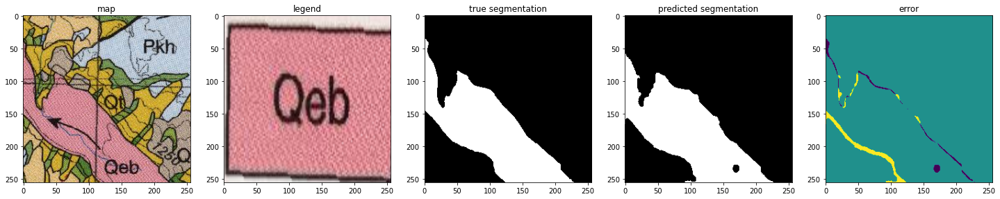

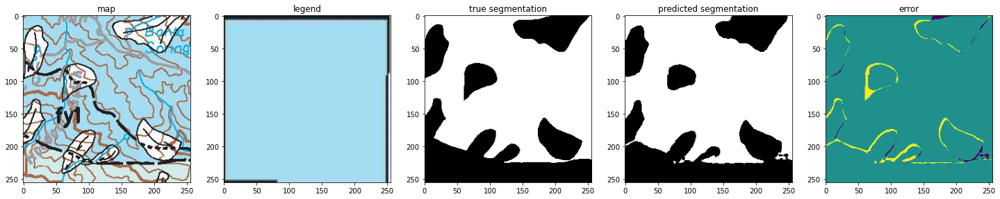

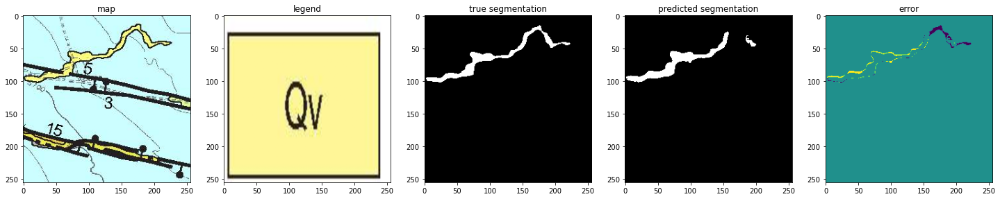

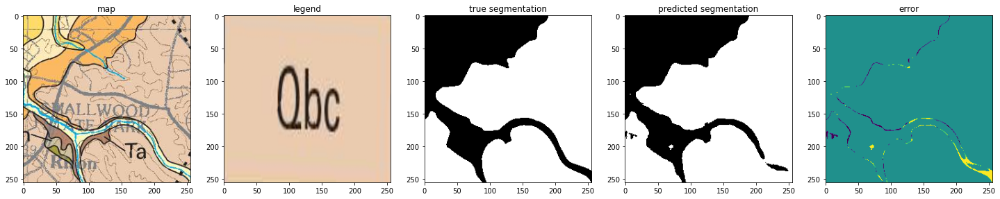

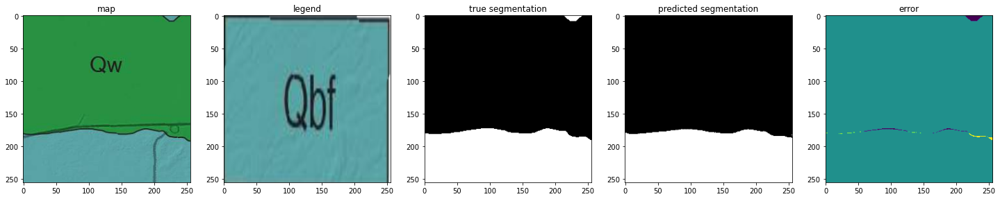

In [52]:
n=5
for fileName in random.sample(validate_file, n):
    plotResult(1, fileName)

1 MT_Choteau_Yb_poly_451.png 0.0026058631921824105


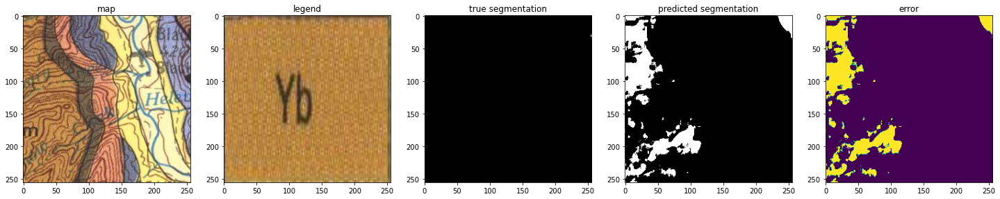

21 CA_BartlettSprings_Qto_poly_1411.png 0.019801980198019802


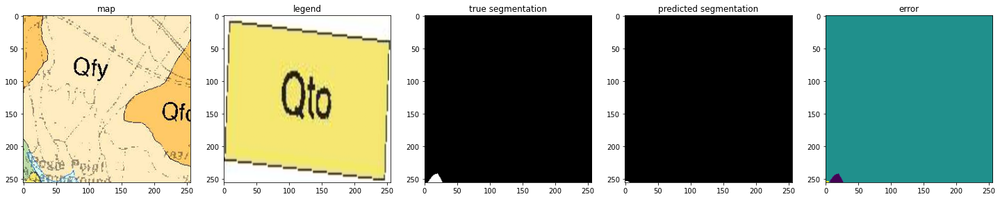

24 AK_Noatak_tra_poly_707.png 0


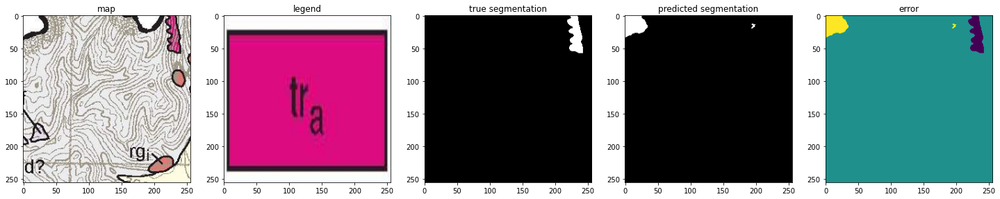

49 AR_Buffalo_west_Pbl_poly_3171.png 0


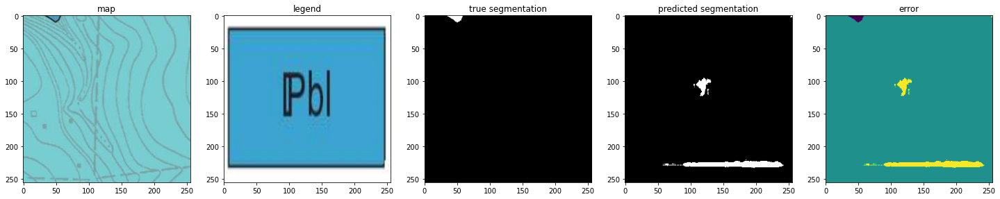

50 CO_PagosaSprings_Kmgr_poly_1257.png 0


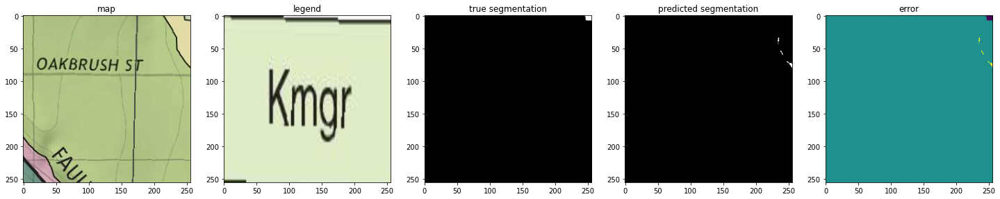

57 AZ_Cane_basemap_Pkh_poly_456.png 0.0029069767441860465


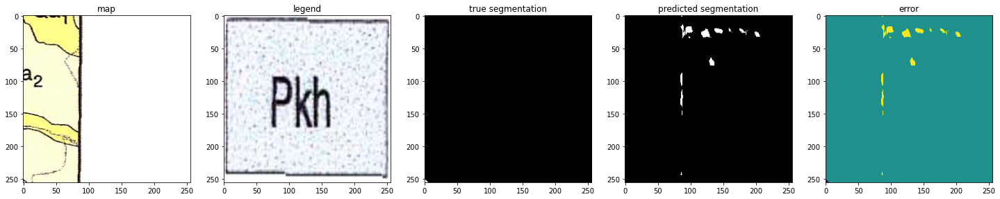

64 MT_Sedan_Kc_poly_470.png 0


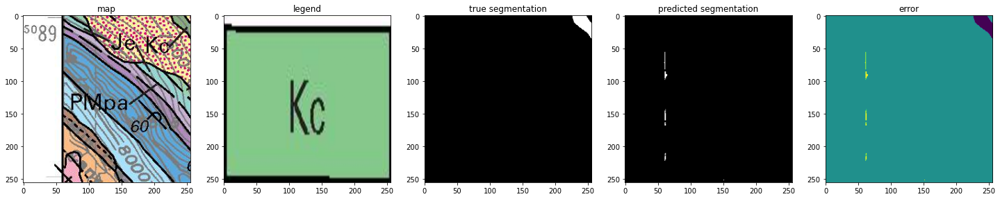

70 CO_SanchezRes_Tsb_poly_1202.png 0


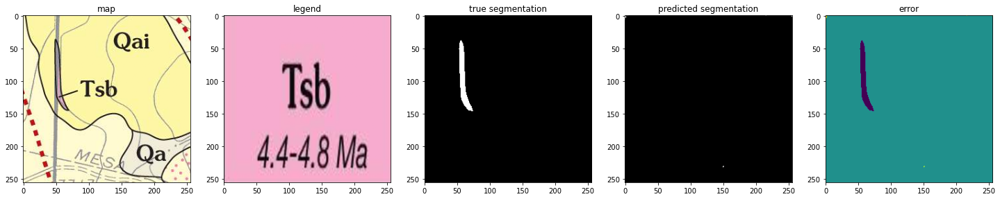

74 CA_Redding_Kc_poly_1046.png 0


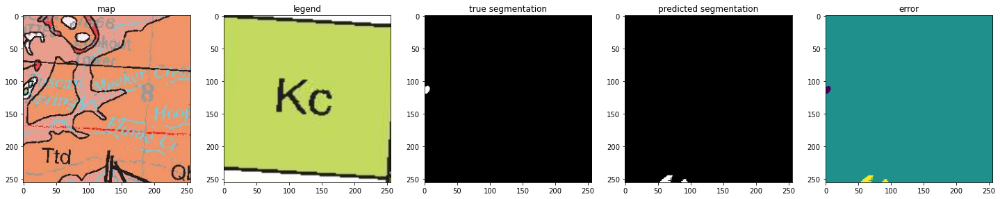

84 AZ_Flagstaff_Qdc2_poly_798.png 0.0031948881789137383


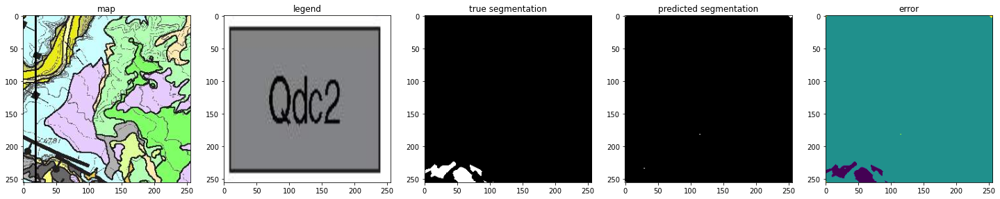

86 CA_SanJose_gs_poly_771.png 0


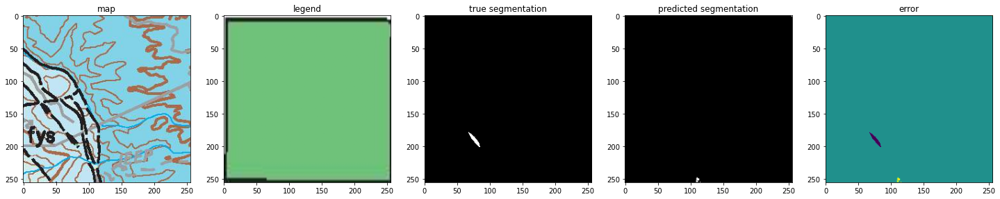

111 CO_Boulder_1978_Qe_poly_725.png 0.0883853104051297


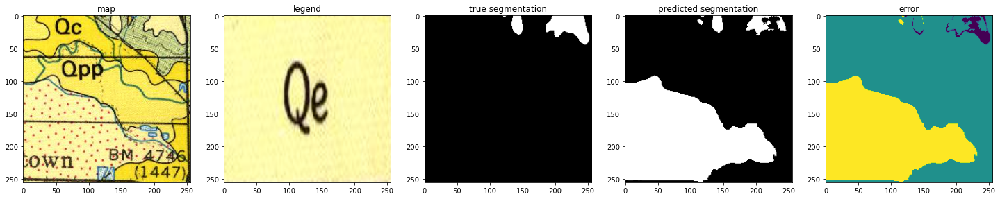

117 AZ_Flagstaff_Qg1_poly_1635.png 0


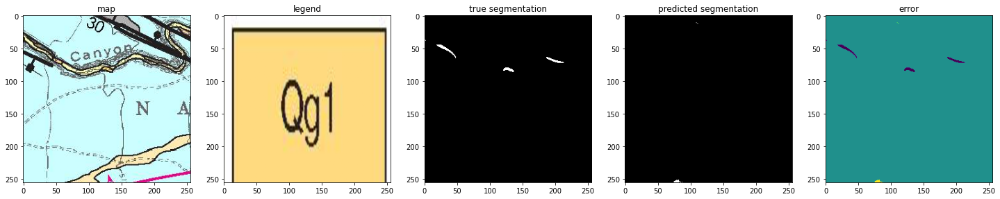

141 CO_Boulder_1978_fault_zone_poly_189.png 0


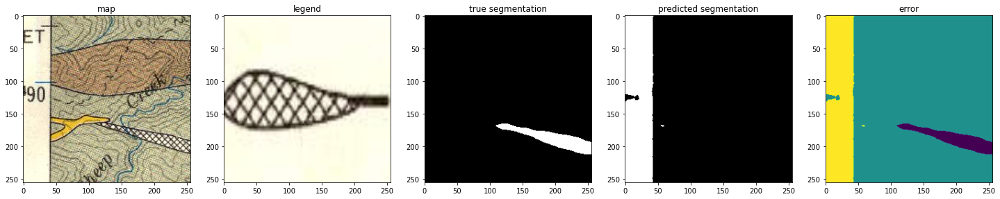

153 CA_Weaverville_Qal_poly_395.png 0.04292302234835048


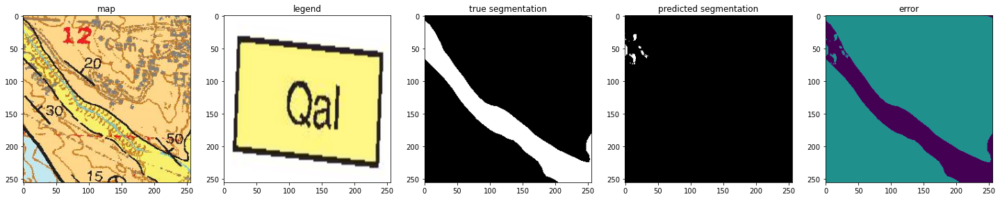

160 CA_CougarButtes_Qyfs_poly_1343.png 0.02284466467895687


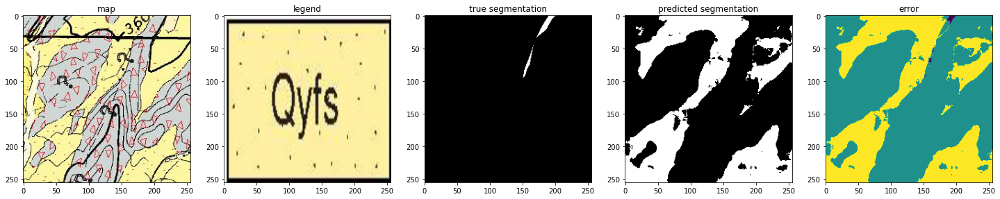

169 AK_Noatak_us_poly_1389.png 0.0017196904557179706


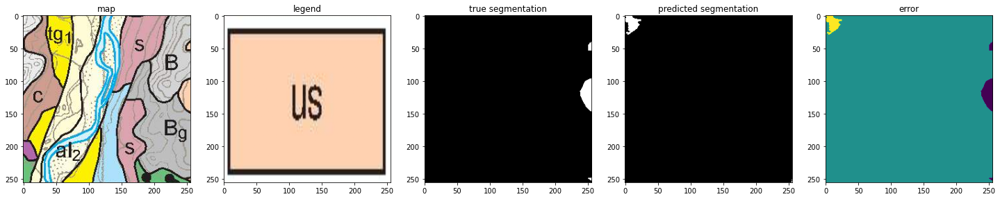

186 OK_250K_Pbi_poly_907.png 0.003863614411281754


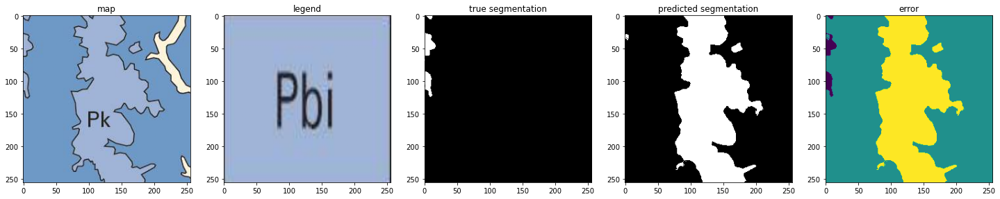

200 AZ_SatanButte_Qd2_poly_673.png 0.008281573498964804


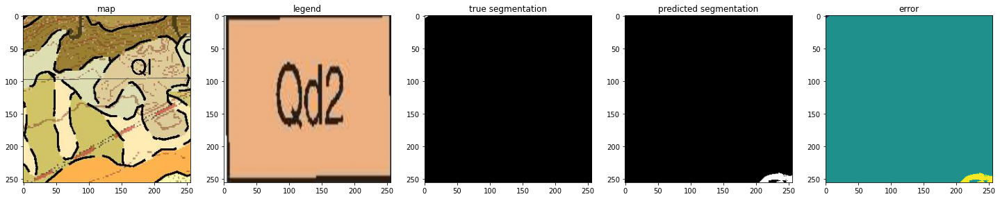

210 CA_SantaMaria_QTpr_poly_1397.png 0.07199562003832466


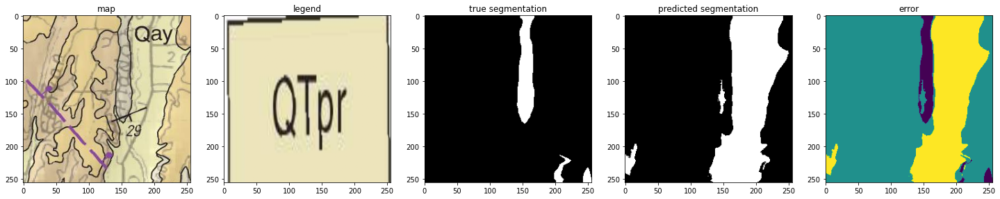

212 AR_Buffalo_west_Oeu_poly_3597.png 0


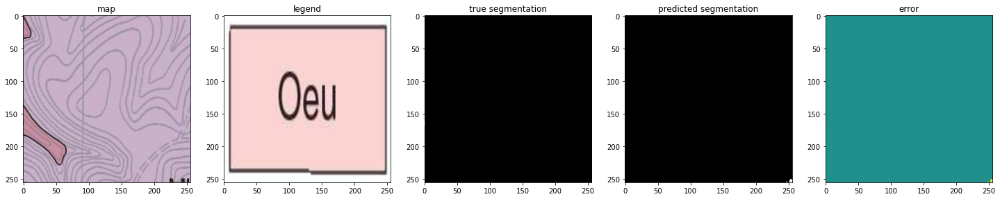

213 MT_Choteau_Yms_poly_549.png 0.030699774266365686


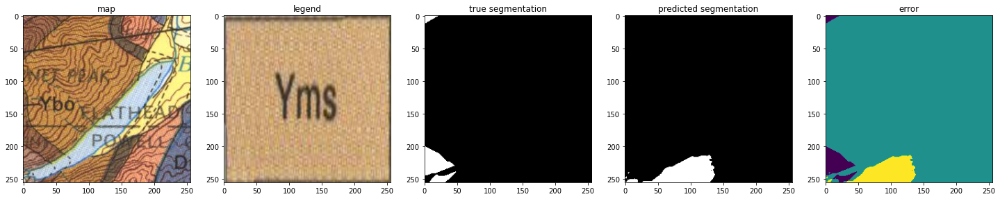

221 CO_HorseMtn_PPm_poly_548.png 0.006464367527536323


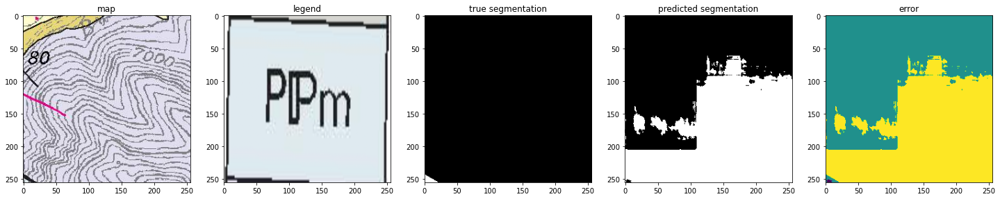

231 AK_HowardPass_Kon_poly_799.png 0


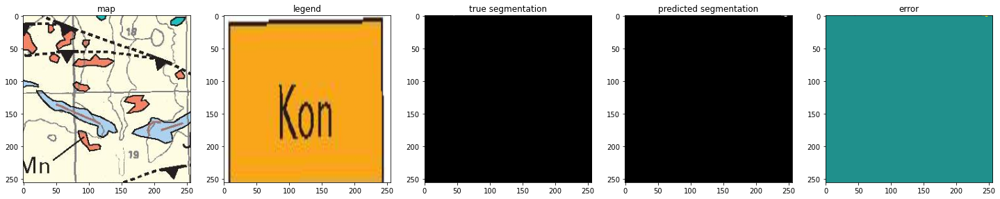

239 CA_Cambria_KJfv_poly_677.png 0.058119658119658114


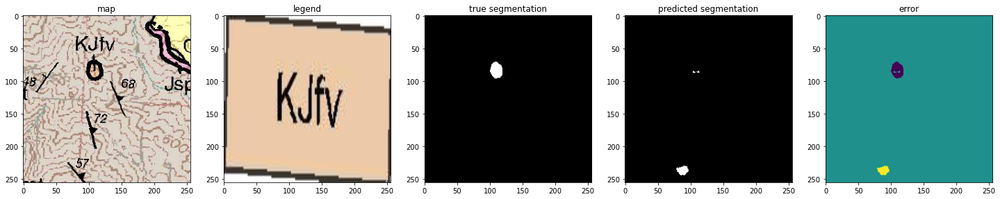

243 CO_Boulder_1978_Ply_poly_432.png 0.03898635477582846


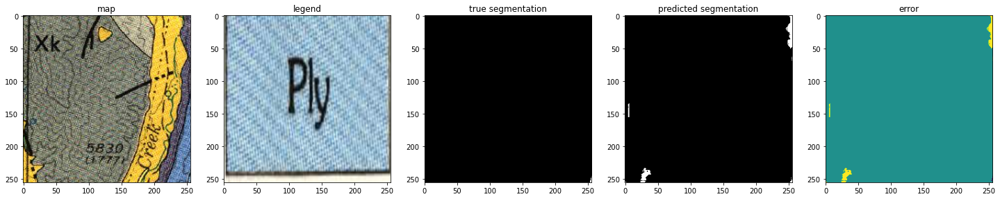

251 AR_Buffalo_west_Oeu_poly_3723.png 0.008230452674897118


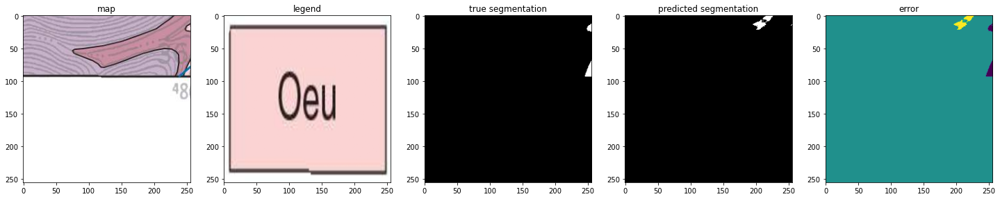

256 CA_NV_LasVegas_Qay_poly_665.png 0.025


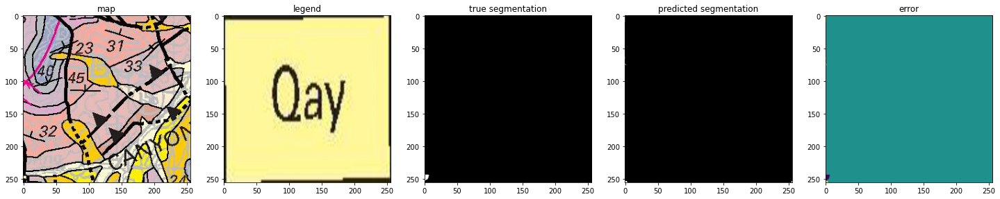

263 AK_StLawrence_Trs_poly_1630.png 0


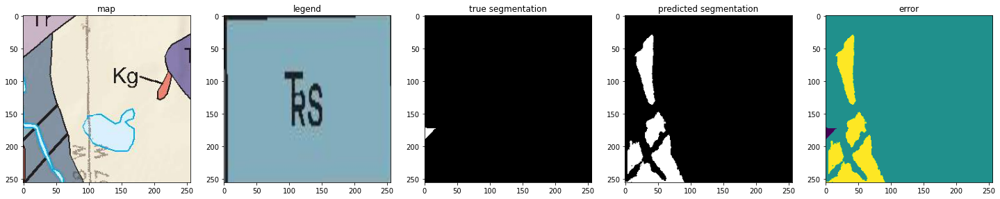

267 AZ_Flagstaff_Qd_poly_303.png 0


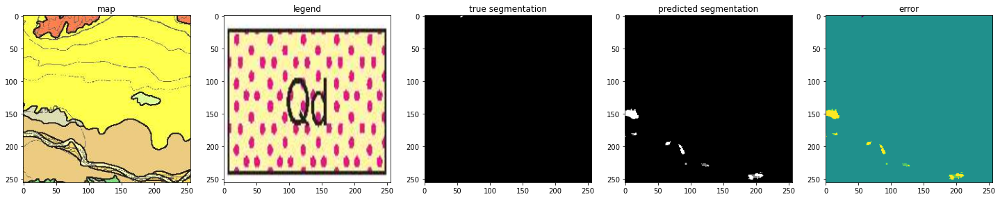

284 CA_YosemiteNP_Tby_poly_1929.png 0.017877497150398946


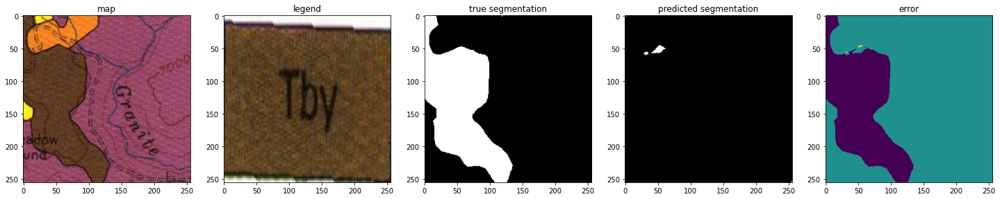

290 AK_Noatak_rgi_poly_700.png 0


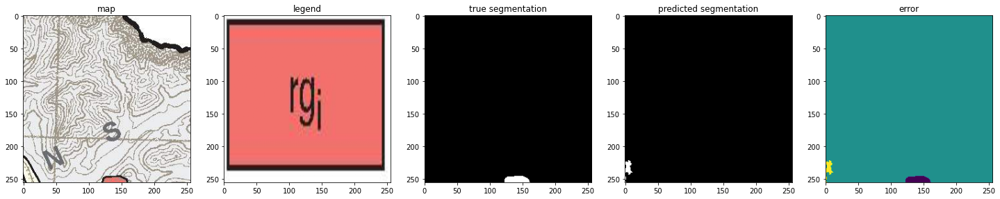

300 AZ_Littlefield_TRms_poly_357.png 0


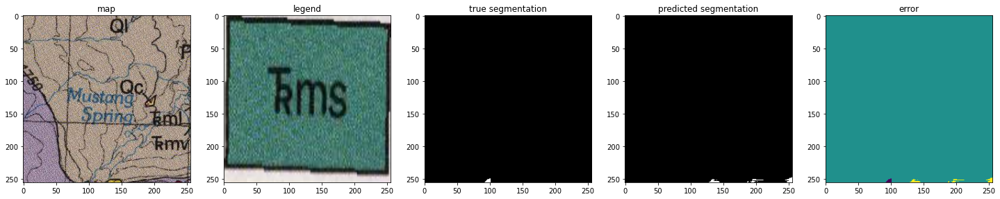

310 CA_BartlettSprings_Qls_poly_557.png 0


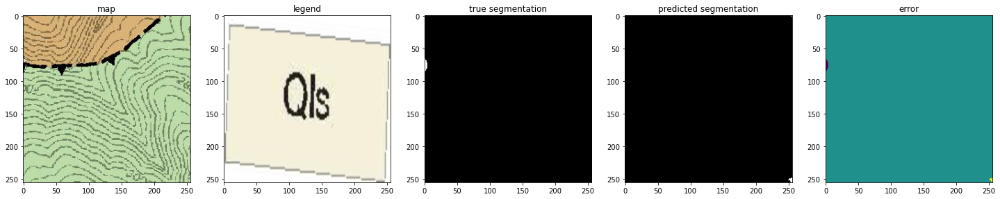

312 AK_HowardPass_JlPip_poly_720.png 0


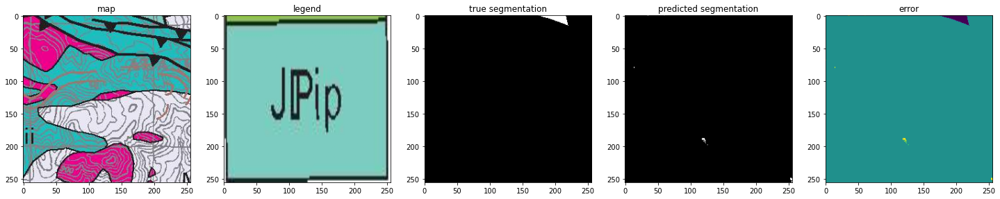

328 AK_LookoutRidge_Qu_poly_993.png 0.007095793208312214


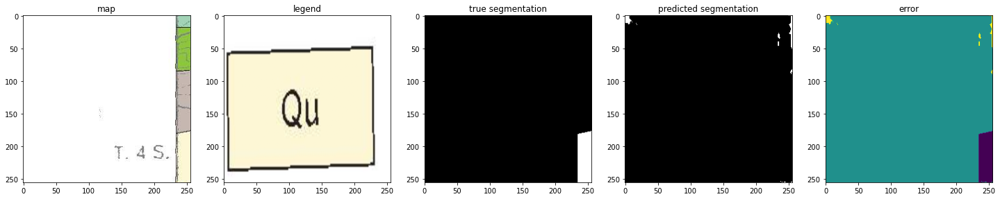

330 AK_Christian_TrMcs_poly_1105.png 0


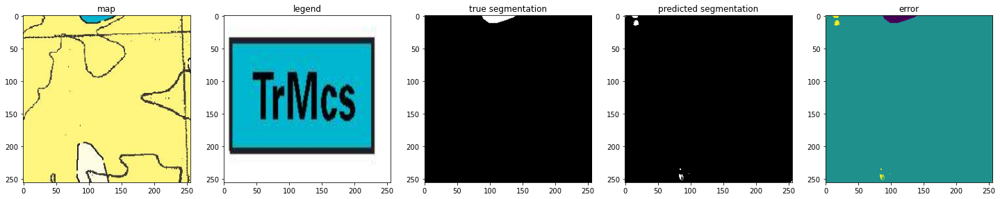

332 CO_VailE100K_Kp_poly_1217.png 0


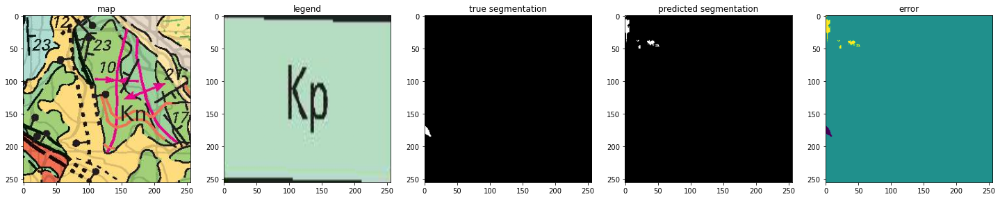

358 CO_Granite_Qc_poly_884.png 0.001279941488389102


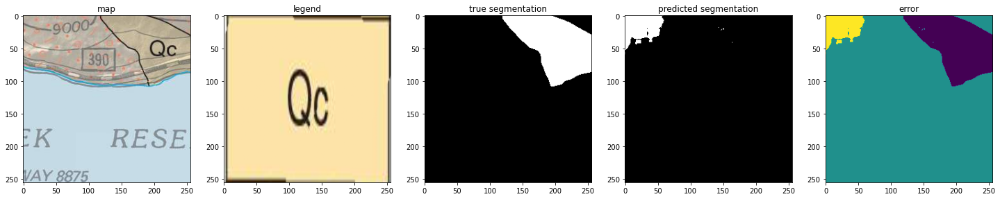

360 AK_Bettles_agl_poly_927.png 0


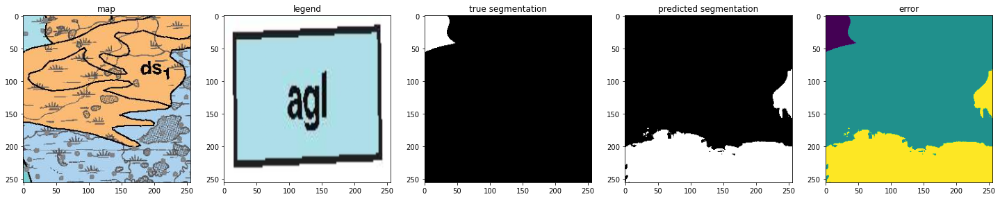

371 AR_Hasty_Mbs_poly_1247.png 0


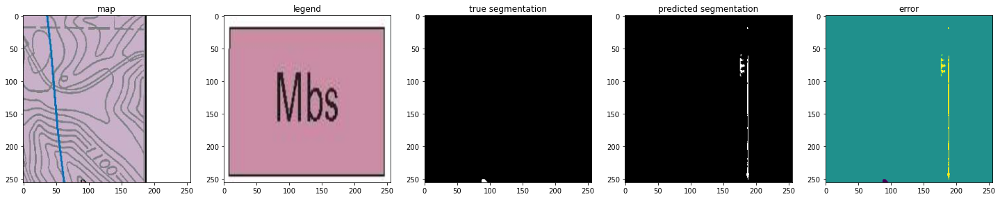

374 CO_BigCostilla_Xho_poly_1195.png 0


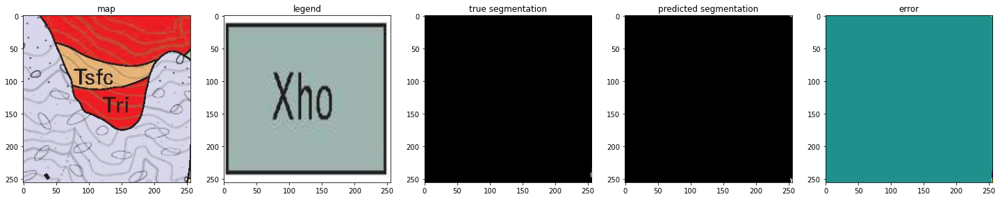

376 AZ_Flagstaff_Qaf_poly_1979.png 0


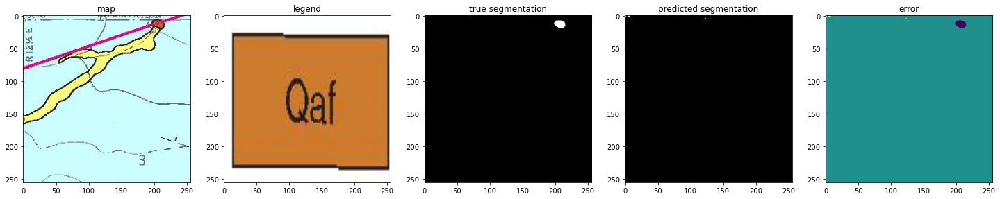

394 AK_Bettles_si_poly_473.png 0


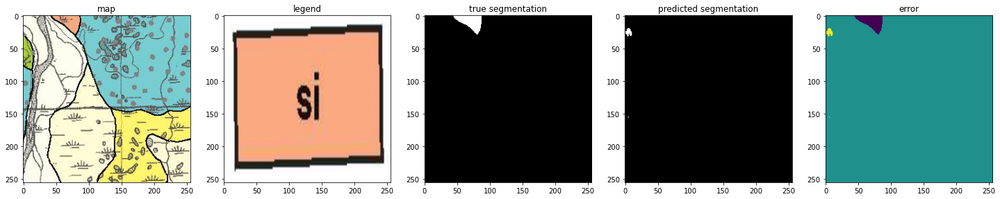

428 AZ_PeachSprings_Xu_poly_1250.png 0


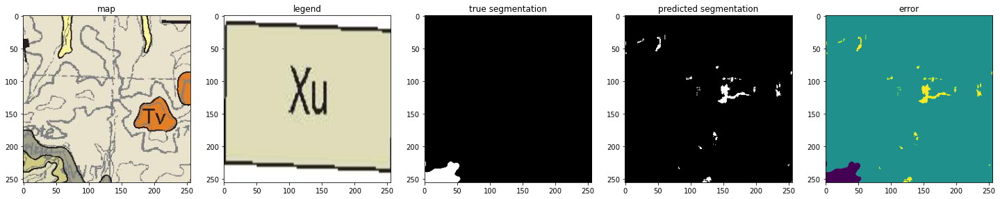

434 AZ_Fredonia_Qgy_poly_307.png 0


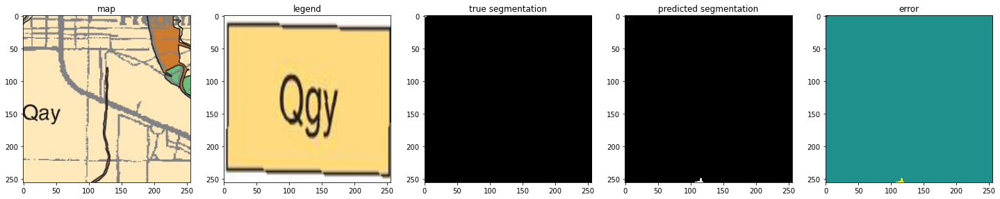

438 CO_Boulder_1978_Kn_poly_573.png 0


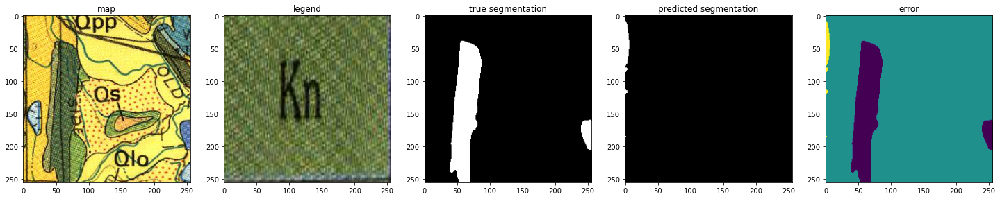

440 CO_Fraser_Qgd_poly_747.png 0.06994839607227785


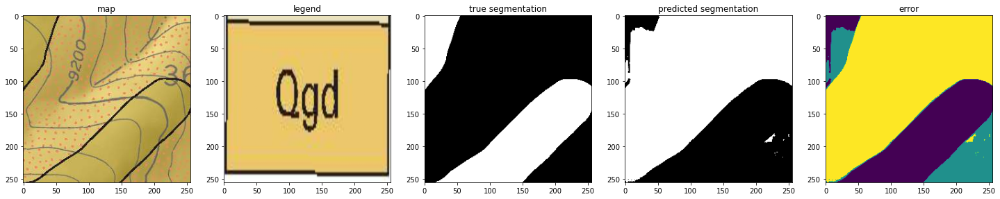

441 AZ_HouseRock_Qg2_poly_1224.png 0.033881008266149606


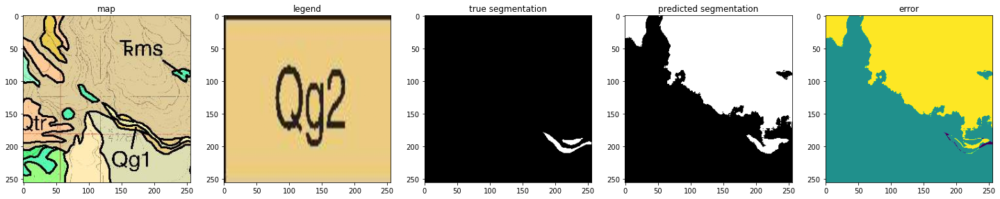

450 AR_Jasper_Mbs_poly_293.png 0


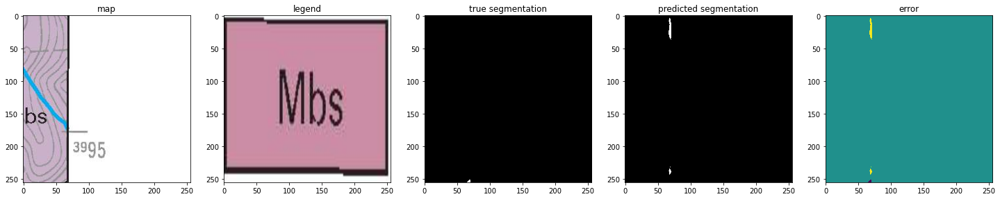

452 CO_FortMorgan_Qaa_poly_1443.png 0.0365767878077374


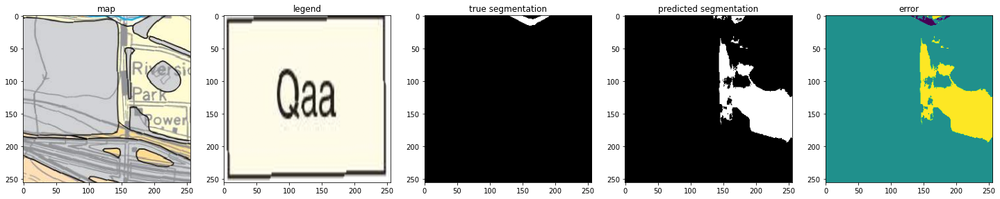

454 CO_Elkhorn_Qp_poly_646.png 0


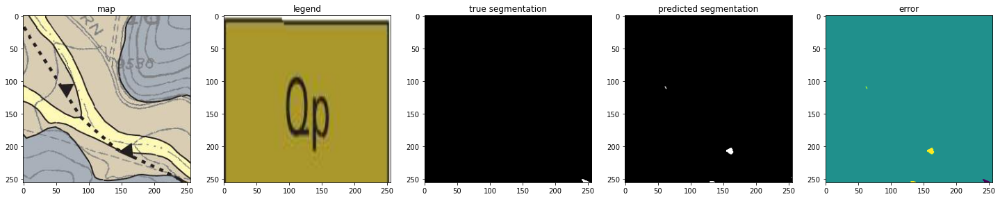

462 CA_YosemiteNP_Qng_poly_1082.png 0


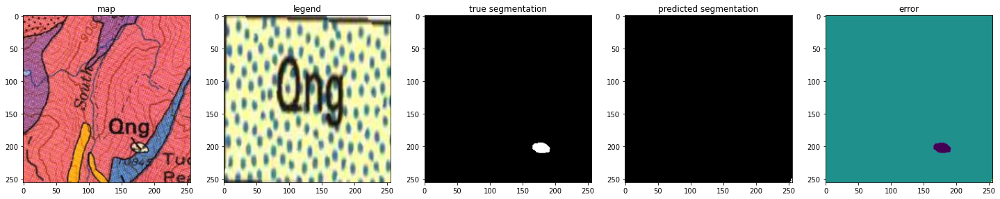

468 AZ_Flagstaff_Qps_poly_839.png 0.015367727771679473


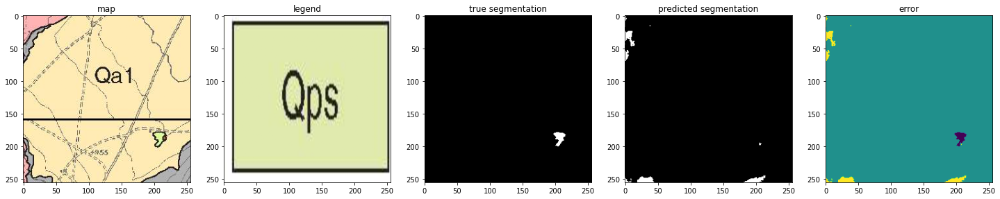

482 AK_HinesCreek_m_poly_1509.png 0.04244937789704806


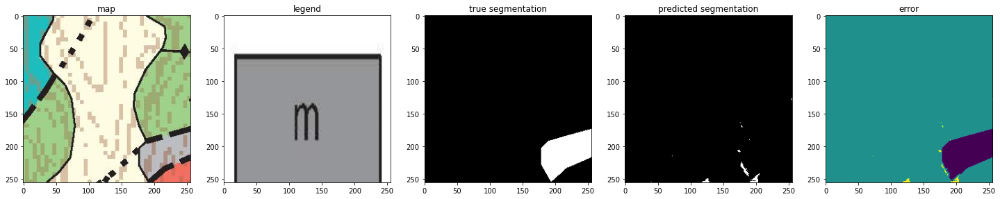

491 AZ_Tucson_TKgm_poly_149.png 0


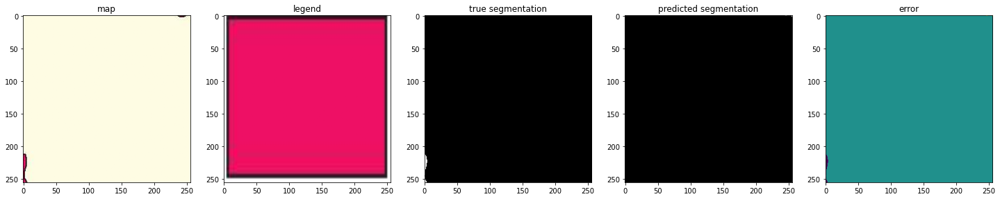

In [ ]:
n=500
files = []
scores = []
idx = 0
for fileName in random.sample(validate_file, n):
    files.append(fileName)
    s, [fileName, map_img, label_img, seg_img, predicted] = getMetric(fileName)
    if s[-1] < 0.1:
        print(idx, fileName, s[-1])
        newplotter(fileName, map_img, label_img, seg_img, predicted, n=1)
    scores.append(s)
    idx += 1


In [ ]:
scores = np.array(scores)
np.median(scores[:, 2])

In [ ]:
plt.hist(np.array(scores)[:,2], bins=50)